**Introduction to Artificial Intelligence and Machine learning, IAI600**

**LAB 6 :**
*Unsupervised Learning Using K-Means Clustering on California Housing Data*

*Gabriel Garreau :*
*gabriel.garreau@student.hv.se*

# Setup and Get the Data

In [3]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "K-Means on California Housing Dataset"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [4]:
import os
import tarfile
import urllib.request

DOWNLOAD_ROOT = "https://raw.githubusercontent.com/ageron/handson-ml2/master/"
HOUSING_PATH = os.path.join("datasets", "housing")
HOUSING_URL = DOWNLOAD_ROOT + "datasets/housing/housing.tgz"

def fetch_housing_data(housing_url=HOUSING_URL, housing_path=HOUSING_PATH):
    if not os.path.isdir(housing_path):
        os.makedirs(housing_path)
    tgz_path = os.path.join(housing_path, "housing.tgz")
    urllib.request.urlretrieve(housing_url, tgz_path)
    housing_tgz = tarfile.open(tgz_path)
    housing_tgz.extractall(path=housing_path)
    housing_tgz.close()

In [5]:
fetch_housing_data()

C:\Users\gabri\AppData\Local\Temp\ipykernel_17784\1387014147.py:15: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  housing_tgz.extractall(path=housing_path)


In [6]:
import pandas as pd

def load_housing_data(housing_path=HOUSING_PATH):
    csv_path = os.path.join(housing_path, "housing.csv")
    return pd.read_csv(csv_path)

# Visualize and Prepare the Data

In [8]:
housing = load_housing_data()
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [9]:
X = np.transpose(np.array([housing["longitude"], housing["latitude"]]))

xm = min(X[:,0])
xp = max(X[:,0])
ym = min(X[:,1])
yp = max(X[:,1])

print(xm, xp, ym, yp)
X

-124.35 -114.31 32.54 41.95


array([[-122.23,   37.88],
       [-122.22,   37.86],
       [-122.24,   37.85],
       ...,
       [-121.22,   39.43],
       [-121.32,   39.43],
       [-121.24,   39.37]])

In [10]:
# Download the California image
images_path = os.path.join(PROJECT_ROOT_DIR, "images", "end_to_end_project")
os.makedirs(images_path, exist_ok=True)
DOWNLOAD_ROOT = "https://raw.githubusercontent.com/ageron/handson-ml2/master/"
filename = "california.png"
print("Downloading", filename)
url = DOWNLOAD_ROOT + "images/end_to_end_project/" + filename
urllib.request.urlretrieve(url, os.path.join(images_path, filename))

import matplotlib.image as mpimg
california_img=mpimg.imread(os.path.join(images_path, filename))

In [11]:
# Ratio of figures
ratio=0.9

taille=10

In [12]:
def plot_clusters(X, y=None):
    plt.scatter(X[:, 0], X[:, 1], alpha=1,
                s=y,
                c=y, cmap=plt.get_cmap("jet"))
    plt.xlabel("$Longitude$", fontsize=14)
    plt.ylabel("$Latitude$", fontsize=14, rotation=90)
    plt.colorbar()
    plt.imshow(california_img, extent=[-124.55, -113.80, 32.45, 42.05], alpha=0.5, cmap=plt.get_cmap("jet"), aspect='auto')
    plt.xlim(xm, xp)
    plt.ylim(ym, yp)

Saving figure X_plot


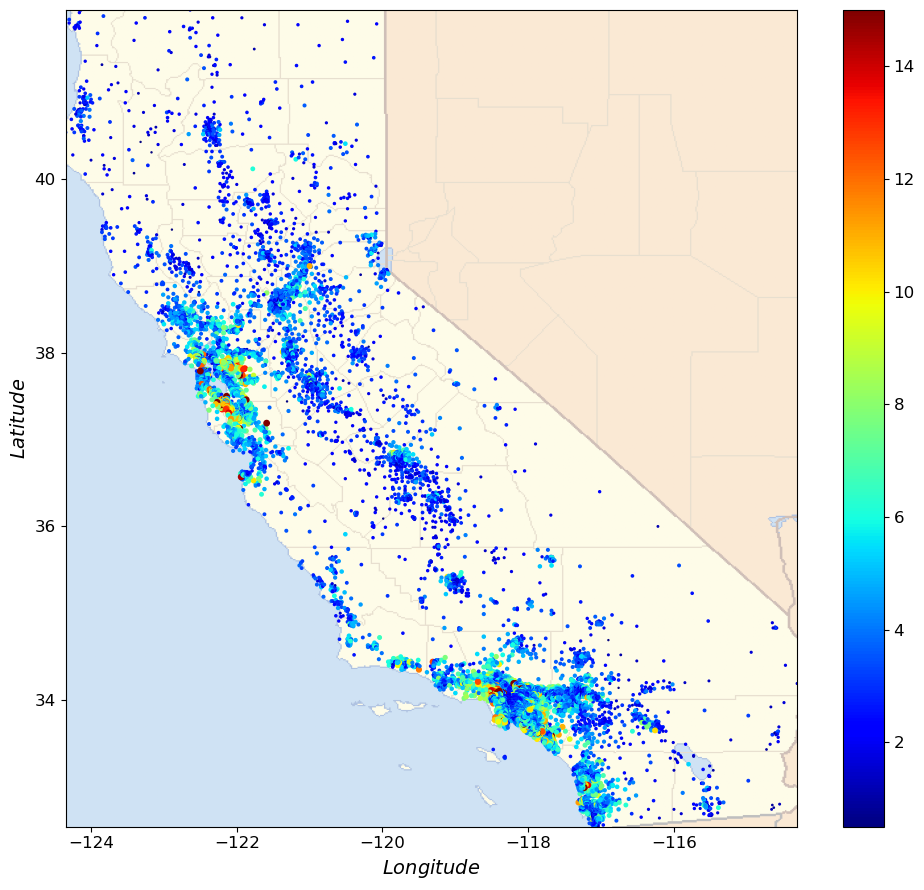

In [13]:
plt.figure(figsize=(taille, taille*ratio))
plot_clusters(X,housing["median_income"])
save_fig("X_plot")
plt.show()

# Applying K-Means on the Database

## Test with random parameters

In [16]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

In [17]:
kmeans = KMeans(n_clusters=10, random_state=42)
y_pred = kmeans.fit_predict(X)
y_pred

array([1, 1, 1, ..., 3, 3, 3])

In [18]:
def plot_data(X, show_bcolor=True):    
    plt.scatter(X[:, 0], X[:, 1], alpha=0.8,
                s=housing["median_income"]*2,
                c=housing["median_income"],
                cmap=plt.get_cmap("jet"))

    if show_bcolor:
        income = housing["median_income"]
        tick_values = np.linspace(0, income.max(), 6)
        cbar = plt.colorbar(ticks=tick_values)
        cbar.ax.set_yticklabels(["$%dk"%(round(v)) for v in tick_values], fontsize=14)
        cbar.set_label('Median Income', fontsize=14)
    
    plt.imshow(california_img, extent=[-124.55, -113.80, 32.45, 42.05], alpha=1, cmap=plt.get_cmap("jet"), aspect='auto')
    plt.xlim(xm, xp)
    plt.ylim(ym, yp)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabel=True, show_ylabel=True, show_bcolor=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]), alpha=0.5,
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X, show_bcolor=show_bcolor)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabel:
        plt.xlabel("$Longitude$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabel:
        plt.ylabel("$Latitude$", fontsize=14, rotation=90)
    else:
        plt.tick_params(labelleft=False)

def plot_silhouette(clusterer, X, silhouette_sco='', show_xlabel=True, show_ylabel=True, title=''):
    k = clusterer.n_clusters
    y_pred = clusterer.labels_
    silhouette_coefficients = silhouette_samples(X, y_pred)

    padding = len(X) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    
    if show_ylabel:
        plt.ylabel("$Cluster$")
    
    if show_xlabel:
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("$Silhouette$ $Coefficient$")
    else:
        plt.tick_params(labelbottom=False)
        
    if title:
        plt.title(title, fontsize=16)

    if not(silhouette_sco):
        silhouette_sco = silhouette_score(X, clusterer.labels_)
    plt.axvline(x=silhouette_sco, color="red", linestyle="--")

def subplot_cluster_and_silhouette(clusterer, X, silhouette_sco='', title=''):
    plt.subplot(1, 2, 1)
    plot_decision_boundaries(clusterer, X)
        
    plt.subplot(1, 2, 2)
    plot_silhouette(clusterer, X, silhouette_sco=silhouette_sco)

    if title:
        plt.suptitle(title, fontsize=18)

def subplot_clusters_and_silhouettes(kmeans_per_k, X, silhouette_scores='', title=''):
    cnt = 0
    len_sub = len(kmeans_per_k)
    clusters_list = [kmeans_per_k[i].n_clusters for i in range(len_sub)]
    for k in k_list:
        cnt = cnt+1
        plt.subplot(len_sub, 2, 2*cnt-1)
        plot_decision_boundaries(kmeans_per_k[cnt-1], X)
        plt.title('Number of clusters: k = {}'.format(k), fontsize=16)
        
        plt.subplot(len_sub, 2, 2*cnt)
        if silhouette_scores:
            plot_silhouette(kmeans_per_k[cnt-1], X, silhouette_sco=silhouette_scores[cnt-1])
        else:
            plot_silhouette(kmeans_per_k[cnt-1], X)
        
    if title:
        plt.title(title, fontsize=20)

Saving figure k_plot_random_test


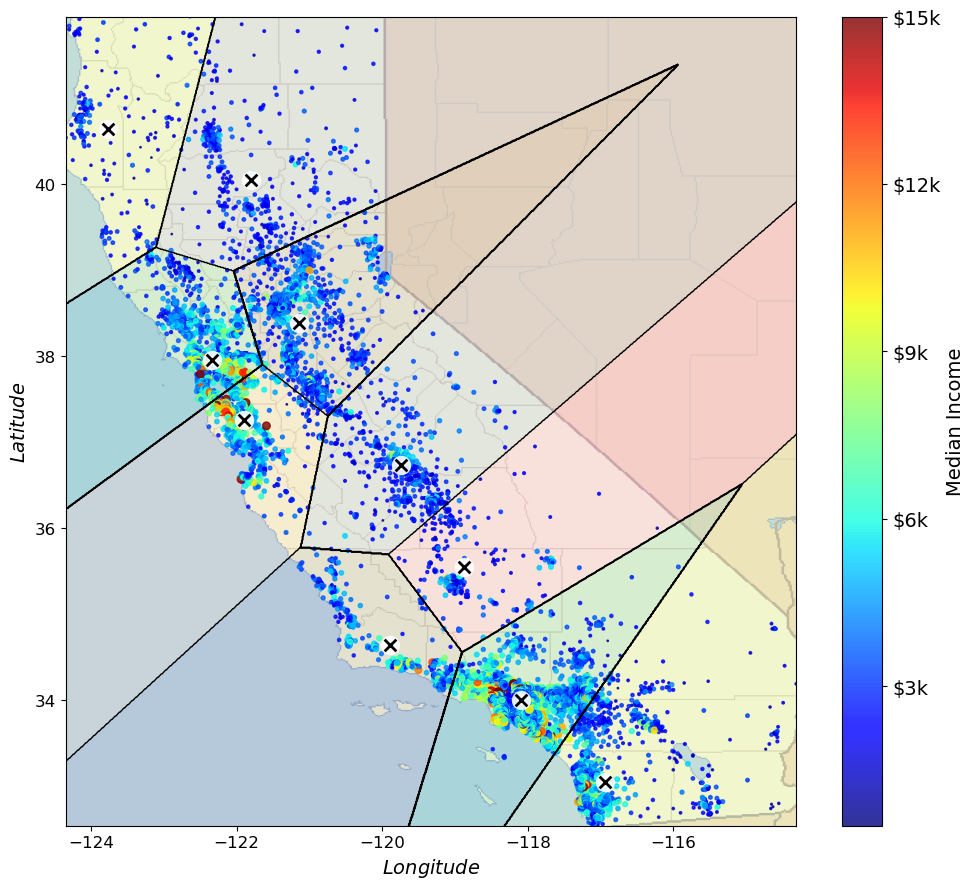

In [19]:
plt.figure(figsize=(taille, taille*ratio))
plot_decision_boundaries(kmeans, X)
save_fig("k_plot_random_test")
plt.show()

In [20]:
y_pred is kmeans.labels_

True

In [21]:
ss = silhouette_score(X, kmeans.labels_)
ss

0.5456037579281242

Saving figure silhouette_plot_random_test


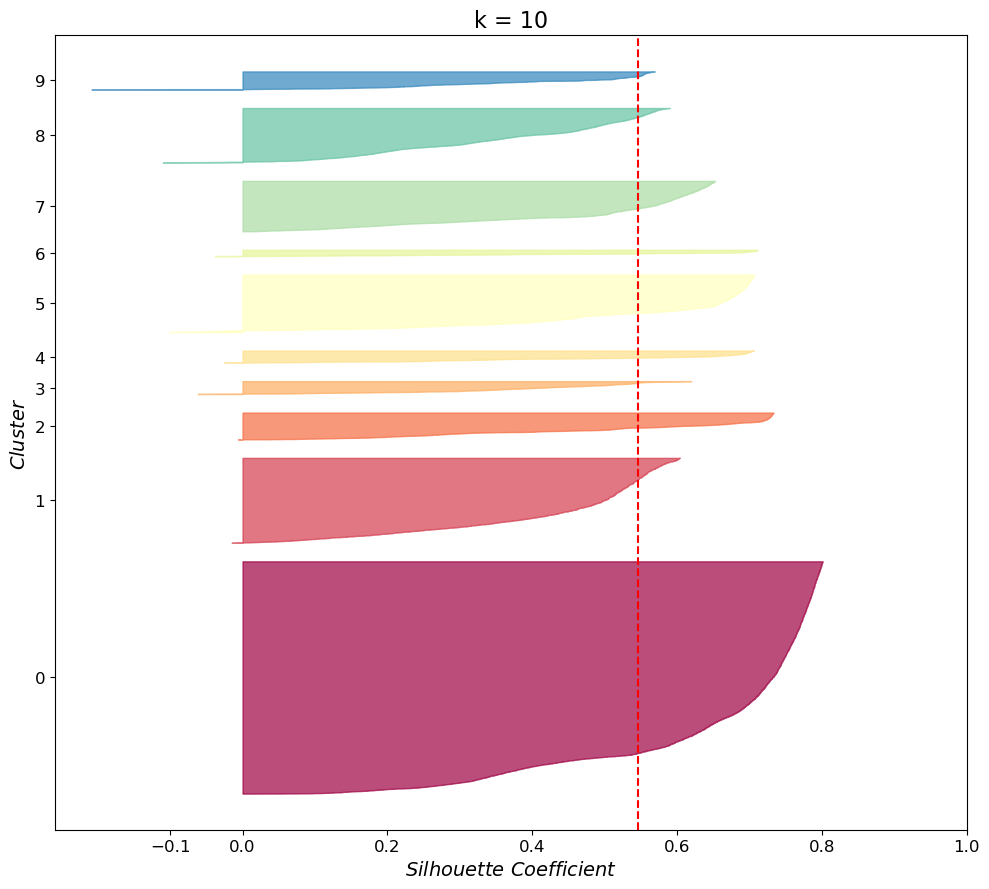

In [22]:
plt.figure(figsize=(10, 9))
plot_silhouette(kmeans, X, silhouette_sco=ss, title='k = {}'.format(kmeans.n_clusters))
save_fig("silhouette_plot_random_test")
plt.show()

## Clusterer Optimisation with Silhouette_score

In [24]:
k_list = range(2, 14)
len(k_list)

12

In [25]:
kmeans_per_k      = [KMeans(n_clusters=k, random_state=42).fit(X) for     k in k_list]
silhouette_scores = [silhouette_score(X, model.labels_)           for model in kmeans_per_k]

In [26]:
print('number of iterations :',len(k_list),'\n')
for i in k_list:
    print('k =',i,':',silhouette_scores[i-k_list[0]])

print('\nSilhouette_max =',max(silhouette_scores),'for k =',kmeans_per_k[np.argmax(silhouette_scores)].n_clusters)

number of iterations : 12 

k = 2 : 0.756243252332563
k = 3 : 0.6471818705345762
k = 4 : 0.6214424487200676
k = 5 : 0.6041145646687827
k = 6 : 0.5358854546158653
k = 7 : 0.5331488637899591
k = 8 : 0.5660909440401278
k = 9 : 0.5426024518817885
k = 10 : 0.5456037579281242
k = 11 : 0.5076106206246548
k = 12 : 0.5173345223942482
k = 13 : 0.5252135610668571

Silhouette_max = 0.756243252332563 for k = 2


Saving figure silhouette_score_vs_k_plot


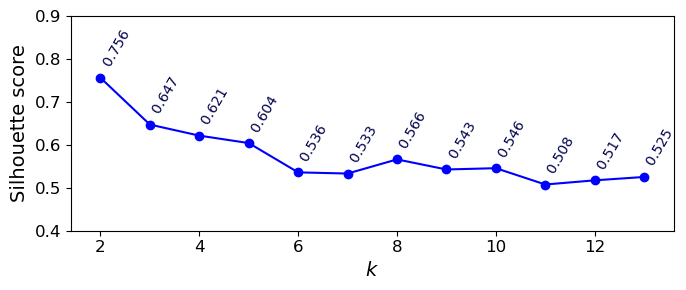

In [27]:
plt.figure(figsize=(7, 3))
plt.plot(k_list, silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.axis([k_list[0]-0.6, k_list[-1]+0.6, 0.4, 0.9])
for i in k_list:
    plt.text(i-0.13, silhouette_scores[i-k_list[0]], '   {}'.format(round(silhouette_scores[i-k_list[0]],3)), rotation=60, color=[0,  0, 0.3])
save_fig("silhouette_score_vs_k_plot")
plt.show()

Saving figure clusters&silhouettes_subplot


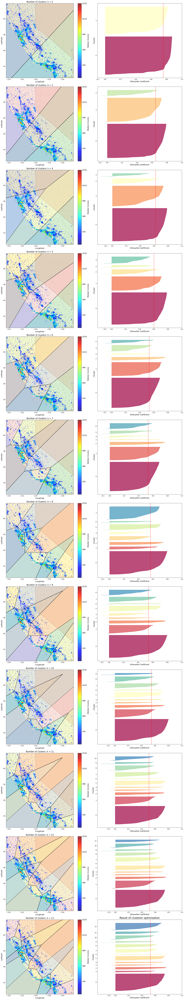

In [28]:
plt.figure(figsize=(2*taille, len(kmeans_per_k)*taille*ratio))
subplot_clusters_and_silhouettes(kmeans_per_k, X, silhouette_scores=silhouette_scores, title='Result of clusterer optimisation')
save_fig("clusters&silhouettes_subplot")
plt.show()

Saving figure cluster&silhouette_k=2_subplot
Saving figure cluster&silhouette_k=3_subplot
Saving figure cluster&silhouette_k=4_subplot
Saving figure cluster&silhouette_k=5_subplot
Saving figure cluster&silhouette_k=6_subplot
Saving figure cluster&silhouette_k=7_subplot
Saving figure cluster&silhouette_k=8_subplot
Saving figure cluster&silhouette_k=9_subplot
Saving figure cluster&silhouette_k=10_subplot
Saving figure cluster&silhouette_k=11_subplot
Saving figure cluster&silhouette_k=12_subplot
Saving figure cluster&silhouette_k=13_subplot


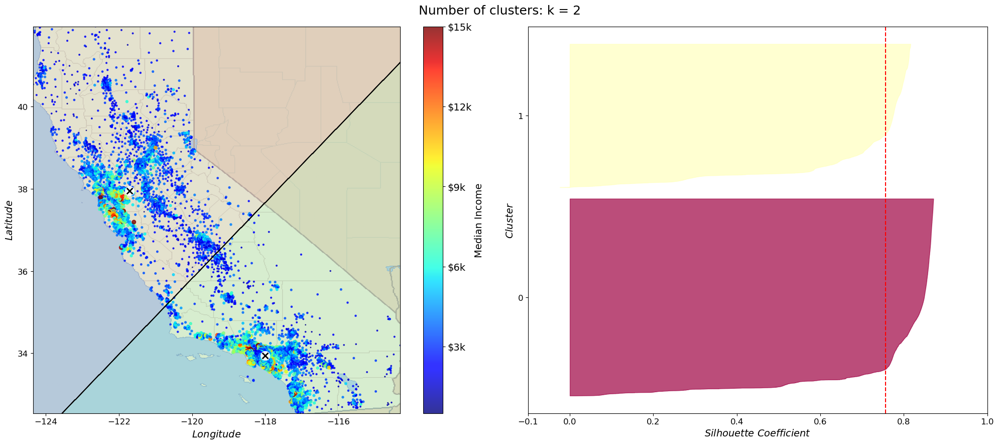

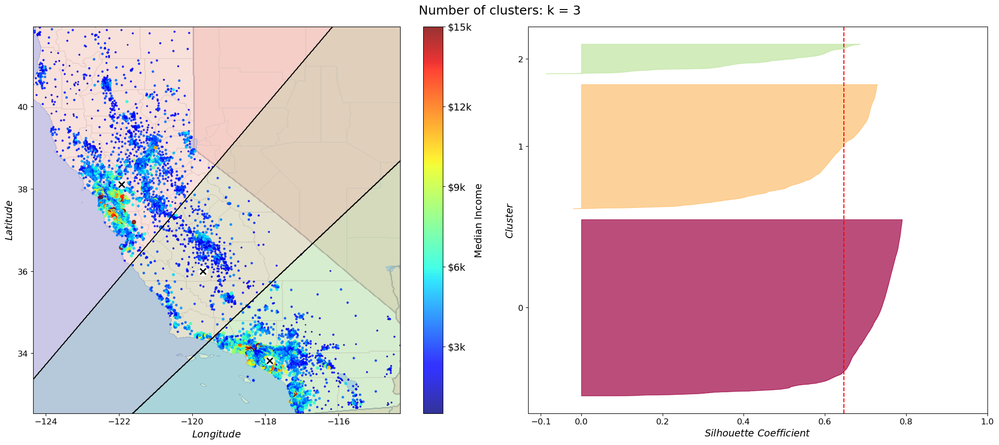

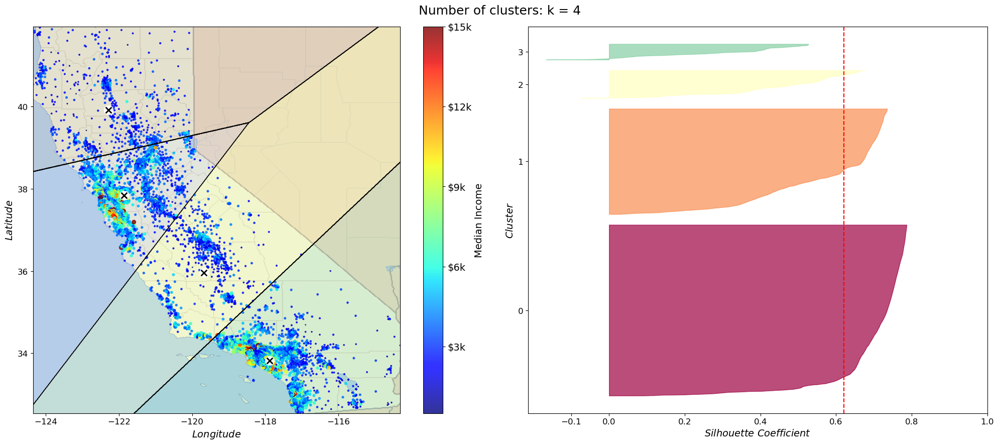

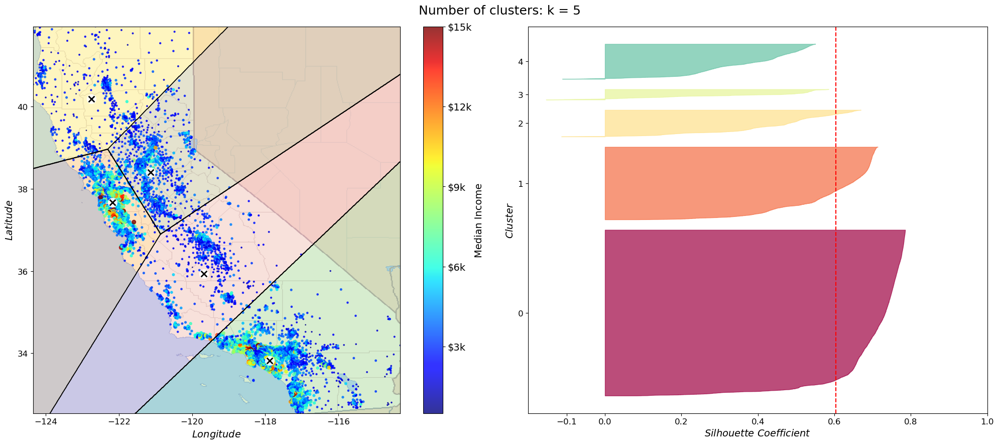

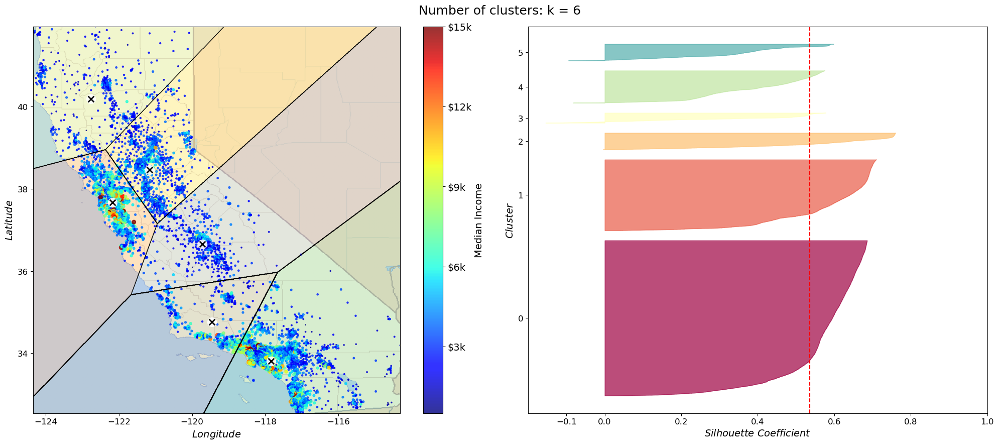

...

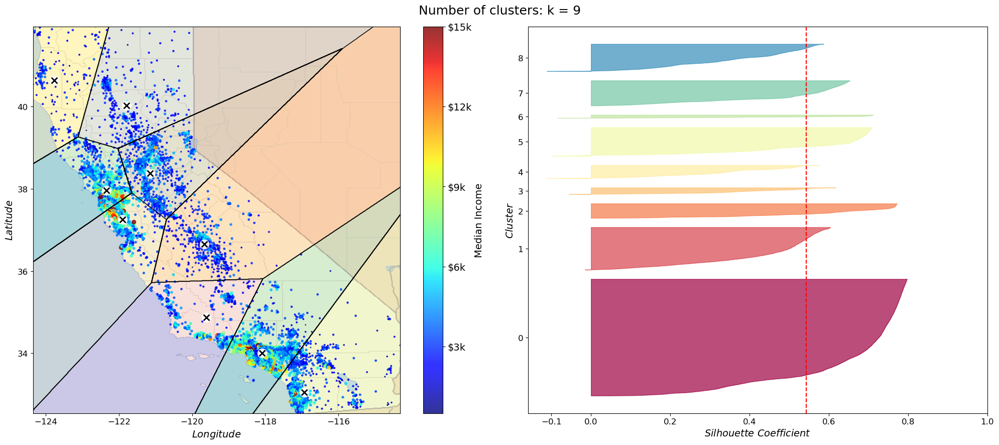

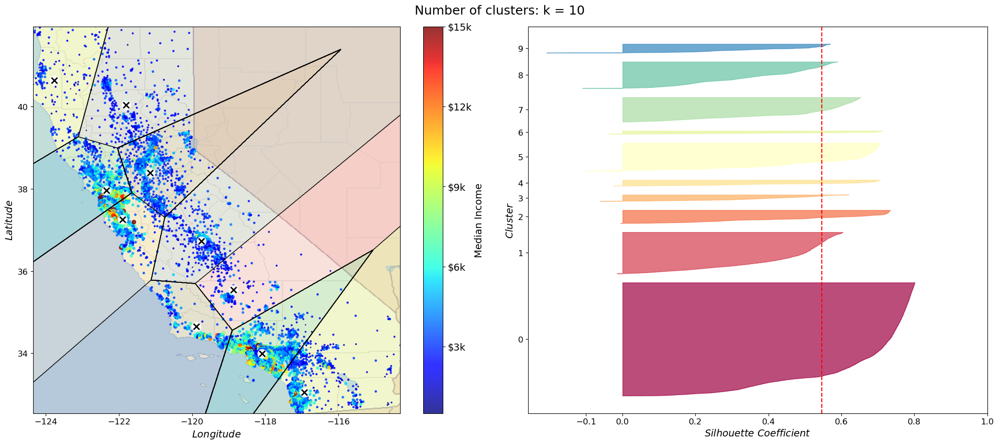

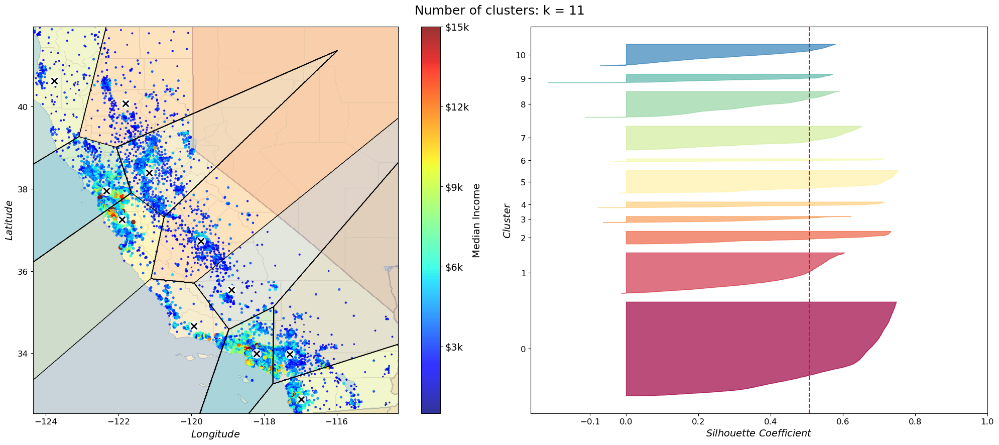

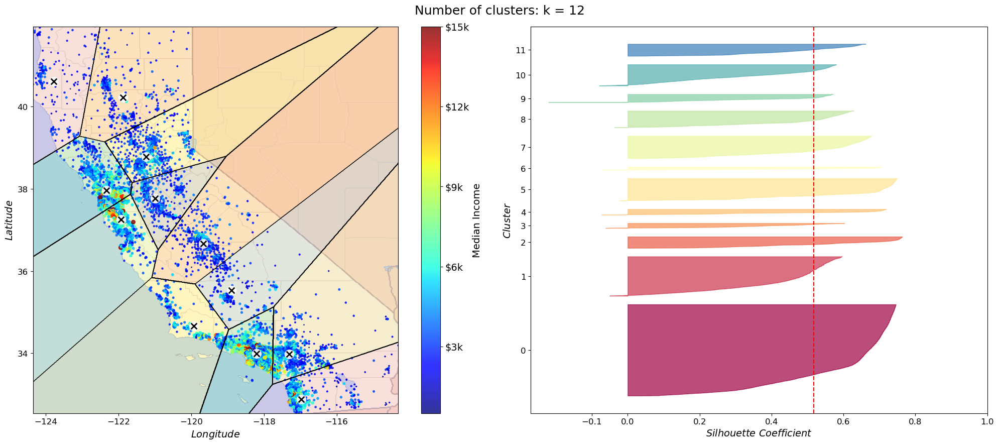

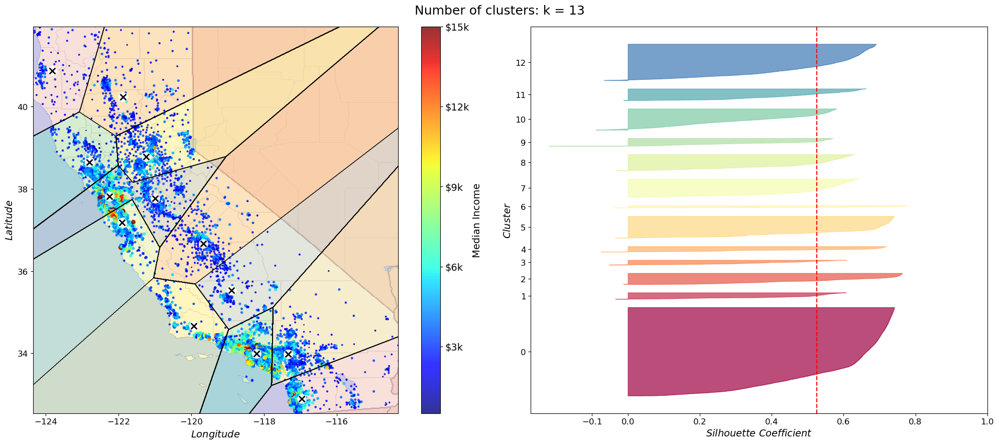

In [29]:
cnt = 0
for k in k_list:
    cnt = cnt+1
    plt.figure(figsize=(2*taille, taille*ratio))
    subplot_cluster_and_silhouette(kmeans_per_k[cnt-1], X, silhouette_sco=silhouette_scores[cnt-1], title='Number of clusters: k = {}'.format(k))
    save_fig("cluster&silhouette_k={}_subplot".format(k))
plt.show()

## Select the best model

In [31]:
K_best = 8
kmeans_best = KMeans(n_clusters=K_best, random_state=42).fit(X)

Saving figure K_best_plot


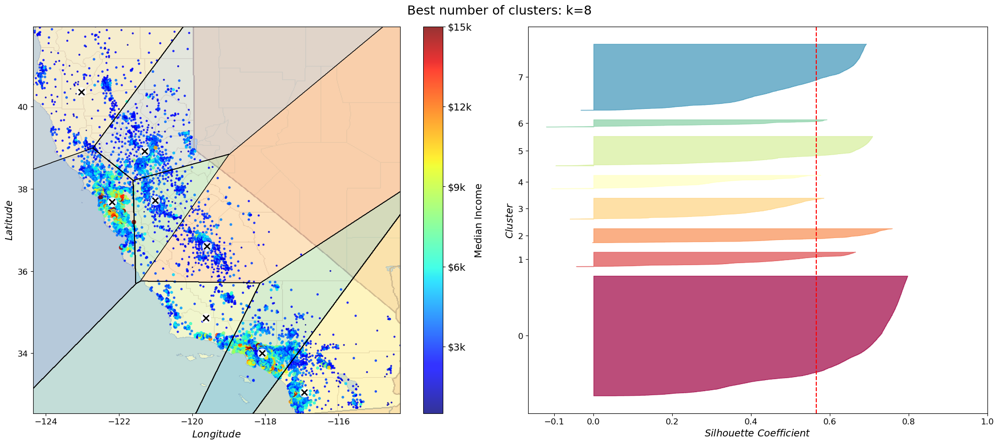

In [32]:
plt.figure(figsize=(2*taille, taille*ratio))
subplot_cluster_and_silhouette(kmeans_best, X, title='Best number of clusters: k={}'.format(K_best))
save_fig("K_best_plot")
plt.show()